In [265]:
# essential libraries
import random
from datetime import timedelta  

# storing and anaysis
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import calmap
import folium

# color pallette
cnf, dth, rec, act = '#393e46', '#ff2e63', '#21bf73', '#fe9801' 

# converter
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()   

# hide warnings
import warnings
warnings.filterwarnings('ignore')

# html embedding
from IPython.display import Javascript
from IPython.core.display import display
from IPython.core.display import HTML

config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '111',
#     'height': 1000,
#     'width':2000,
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}

In [220]:
df = pd.read_csv('covid_19_clean_complete.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.head(6)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0
1,NaN,Albania,41.1533,20.1683,2020-01-22,0,0,0
2,NaN,Algeria,28.0339,1.6596,2020-01-22,0,0,0
3,NaN,Andorra,42.5063,1.5218,2020-01-22,0,0,0
4,NaN,Angola,-11.2027,17.8739,2020-01-22,0,0,0
5,NaN,Antigua and Barbuda,17.0608,-61.7964,2020-01-22,0,0,0


In [221]:
print(df.info())
print(df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16055 entries, 0 to 16054
Data columns (total 8 columns):
Province/State    4875 non-null object
Country/Region    16055 non-null object
Lat               16055 non-null float64
Long              16055 non-null float64
Date              16055 non-null datetime64[ns]
Confirmed         16055 non-null int64
Deaths            16055 non-null int64
Recovered         16055 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 1003.5+ KB
None
Province/State    11180
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered             0
dtype: int64


## Data Cleaning

In [222]:
import pycountry_convert as pc

def continent(country):
    try:
        country_code = pc.country_name_to_country_alpha2(country, cn_name_format="default")
#     print(country_code)
        try:
            continent_name = pc.country_alpha2_to_continent_code(country_code)

        except:
            continent_name = "Unknown"
    except:
        continent_name = "Unknown"
    return continent_name


In [223]:
df_clean = df
df_clean["Province/State"].fillna("", inplace=True)
df_clean["Active"] = df_clean["Confirmed"]-df_clean["Recovered"]-df_clean["Deaths"]
df_clean["Active"] = df_clean["Active"].fillna(0)
df_clean["Recovered"] = df_clean["Recovered"].fillna(0)
df_clean["Deaths"] = df_clean["Deaths"].fillna(0)
df_clean.loc[df_clean['Country/Region'] == 'US', 'Country/Region'] = 'USA'
# df_clean.tail(20)

for i in range(len(df_clean)) : 
  df_clean.loc[i,"Continent"]=continent(df_clean.loc[i, "Country/Region"])

df_clean.loc[df_clean['Continent'] == 'AS', 'Continent'] = 'Asia'
df_clean.loc[df_clean['Continent'] == 'EU', 'Continent'] = 'Europe'
df_clean.loc[df_clean['Continent'] == 'AF', 'Continent'] = 'Africa'
df_clean.loc[df_clean['Continent'] == 'NA', 'Continent'] = 'North America'
df_clean.loc[df_clean['Continent'] == 'SA', 'Continent'] = 'South America'
df_clean.loc[df_clean['Continent'] == 'OC', 'Continent'] = 'Australia'


df_clean['New_ID'] = df_clean.index + 0

df_clean = df_clean.sort_values(by="Date")
df_clean['time']=df_clean.Date.apply(lambda x: x.date()).apply(str)



df_clean.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,Continent,New_ID,time
0,,Afghanistan,33.0000,65.0000,2020-01-22,0,0,0,0,Asia,0,2020-01-22
157,,Mauritius,-20.2000,57.5000,2020-01-22,0,0,0,0,Africa,157,2020-01-22
158,,Mexico,23.6345,-102.5528,2020-01-22,0,0,0,0,North America,158,2020-01-22
159,,Moldova,47.4116,28.3699,2020-01-22,0,0,0,0,Europe,159,2020-01-22
160,,Monaco,43.7333,7.4167,2020-01-22,0,0,0,0,Europe,160,2020-01-22


In [224]:
## Segregrate China and Outside China

In [225]:
# cases in the ships
ship = df_clean[df_clean['Province/State'].str.contains('Grand Princess')|df_clean['Country/Region'].str.contains('Diamond Princess')]

# china and the row
china = df_clean[df_clean['Country/Region']=='China']
row = df_clean[df_clean['Country/Region']!='China']

# latest
full_latest = df_clean[df_clean['Date'] == max(df_clean['Date'])].reset_index()
china_latest = full_latest[full_latest['Country/Region']=='China']
row_latest = full_latest[full_latest['Country/Region']!='China']

# latest condensed
full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

In [226]:
df_group_by_country_date = df_clean.groupby(['Date','Country/Region'])['Confirmed','Recovered', 'Deaths', 'Active'].sum().reset_index()

In [227]:
## Latest data available till 26/03/2020

In [228]:
df_total = df_clean.groupby(['Country/Region', 'Province/State'])['Date','Confirmed', 'Deaths', 'Recovered', 'Active' ].max()
df_total['Date'].max()

Timestamp('2020-03-26 00:00:00')

In [229]:
## Total cases and Death Rate until 26-03-2020

In [230]:
total_cases = df_total['Confirmed'].sum()
total_deaths = df_total['Deaths'].sum()
total_recovered = df_total['Recovered'].sum()
date = df_total['Date'].max()
death_rate = (total_deaths/total_cases)*100
x = pd.DataFrame({'Date':date,'Total Confirmed':total_cases , 'Total Deaths': total_deaths, 'Total Recovered': total_recovered
             ,'Death Rate':death_rate}, index=[0])
x.head()

,Date,Total Confirmed,Total Deaths,Total Recovered,Death Rate
0,2020-03-26,529607,23979,122033,4.527697


In [231]:
import plotly.graph_objects as go

labels = ['Total Confirmed Cases','Total Deaths','Total Recovered']
values = [total_cases, total_deaths, total_recovered]

# pull is given as a fraction of the pie radius
fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0.2,0],textinfo='label+percent')])

fig.show()

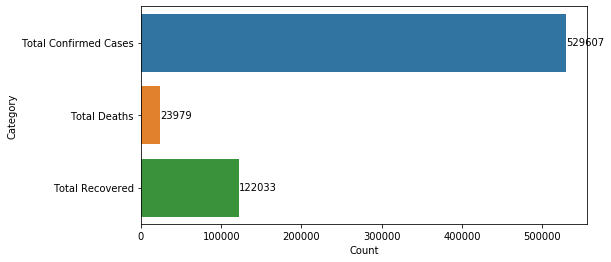

In [232]:
def show_values_on_bars(axs, h_v="v", space=0.4):
    def _show_on_single_plot(ax):
        if h_v == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                value = int(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif h_v == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height()/2
                value = int(p.get_width())
                ax.text(_x, _y, value ,va="center", ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)
        

list1 = ['Total Confirmed Cases','Total Deaths','Total Recovered']
list2 = []
list2.append(int(total_cases))
list2.append(int(total_deaths))
list2.append(int(total_recovered))

df_temp = pd.DataFrame(list(zip(list1, list2)), 
               columns =['Category', 'Count']) 
plt.figure(figsize=(8, 4))
ax = sns.barplot(y="Category", x="Count", data=df_temp)
show_values_on_bars(ax, "h", 0.5)

In [233]:
## Cases, deaths and recoveries country wise

In [234]:
df_latest = df_clean[df_clean['Date'] == max(df_clean['Date'])].reset_index()
df_latest = df_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

stats = df_latest[['Country/Region','Confirmed', 'Active', 'Deaths', 'Recovered']]

stats = stats.sort_values(by='Confirmed', ascending=False)
stats = stats.reset_index(drop=True)

stats.style.background_gradient(cmap="Blues", subset=['Confirmed', 'Active'])\
            .background_gradient(cmap="Greens", subset=['Recovered'])\
            .background_gradient(cmap="Reds", subset=['Deaths'])

,Country/Region,Confirmed,Active,Deaths,Recovered
0,USA,83836,81946,1209,681
1,China,81782,4310,3291,74181
2,Italy,80589,62013,8215,10361
3,Spain,57786,46406,4365,7015
4,Germany,43938,37998,267,5673
5,France,29551,22898,1698,4955
6,Iran,29406,16715,2234,10457
7,United Kingdom,11812,11082,580,150
8,Switzerland,11811,11489,191,131
9,South Korea,9241,4966,131,4144


In [235]:
stats = stats.sort_values(by='Deaths', ascending=False).reset_index(drop=True)
stats['Death Rate %'] = (stats['Deaths']/stats['Confirmed'])*100
death_stats = stats[['Country/Region','Deaths','Death Rate %']]
death_stats.head(10)
death_stats.style.background_gradient(cmap="Reds", subset=['Deaths'])

,Country/Region,Deaths,Death Rate %
0,Italy,8215,10.1937
1,Spain,4365,7.55373
2,China,3291,4.02411
3,Iran,2234,7.59709
4,France,1698,5.746
5,USA,1209,1.4421
6,United Kingdom,580,4.91026
7,Netherlands,435,5.82485
8,Germany,267,0.607674
9,Belgium,220,3.52847


In [236]:


for i in range(len(df_latest)) : 
  df_latest.loc[i,"Continent"]=continent(df_latest.loc[i, "Country/Region"])

df_latest.loc[df_latest['Continent'] == 'AS', 'Continent'] = 'Asia'
df_latest.loc[df_latest['Continent'] == 'EU', 'Continent'] = 'Europe'
df_latest.loc[df_latest['Continent'] == 'AF', 'Continent'] = 'Africa'
df_latest.loc[df_latest['Continent'] == 'NA', 'Continent'] = 'North America'
df_latest.loc[df_latest['Continent'] == 'SA', 'Continent'] = 'South America'
df_latest.loc[df_latest['Continent'] == 'OC', 'Continent'] = 'Australia'

df_latest.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,Continent
0,Afghanistan,94,4,2,88,Asia
1,Albania,174,6,17,151,Europe
2,Algeria,367,25,29,313,Africa
3,Andorra,224,3,1,220,Europe
4,Angola,4,0,0,4,Africa


In [237]:
df_group_by_country_date = df_group_by_country_date.sort_values(by="Date")
df_group_by_country_date['time']=df_group_by_country_date.Date.apply(lambda x: x.date()).apply(str)

for i in range(len(df_group_by_country_date)) : 
  df_group_by_country_date.loc[i,"Continent"]=continent(df_group_by_country_date.loc[i, "Country/Region"])

df_group_by_country_date.loc[df_group_by_country_date['Continent'] == 'AS', 'Continent'] = 'Asia'
df_group_by_country_date.loc[df_group_by_country_date['Continent'] == 'EU', 'Continent'] = 'Europe'
df_group_by_country_date.loc[df_group_by_country_date['Continent'] == 'AF', 'Continent'] = 'Africa'
df_group_by_country_date.loc[df_group_by_country_date['Continent'] == 'NA', 'Continent'] = 'North America'
df_group_by_country_date.loc[df_group_by_country_date['Continent'] == 'SA', 'Continent'] = 'South America'
df_group_by_country_date.loc[df_group_by_country_date['Continent'] == 'OC', 'Continent'] = 'Australia'


df_group_by_country_date


,Date,Country/Region,Confirmed,Recovered,Deaths,Active,time,Continent
0,2020-01-22,Afghanistan,0,0,0,0,2020-01-22,Asia
112,2020-01-22,Namibia,0,0,0,0,2020-01-22,Africa
113,2020-01-22,Nepal,0,0,0,0,2020-01-22,Asia
114,2020-01-22,Netherlands,0,0,0,0,2020-01-22,Europe
115,2020-01-22,New Zealand,0,0,0,0,2020-01-22,Australia
116,2020-01-22,Nicaragua,0,0,0,0,2020-01-22,North America
117,2020-01-22,Niger,0,0,0,0,2020-01-22,Africa
118,2020-01-22,Nigeria,0,0,0,0,2020-01-22,Africa
119,2020-01-22,North Macedonia,0,0,0,0,2020-01-22,Europe
111,2020-01-22,Mozambique,0,0,0,0,2020-01-22,Africa


In [238]:
## Outbreak in continents and shift of pandemic epicentre 

In [290]:
import plotly.express as px


fig = px.bar(df_group_by_country_date, x="Continent", y="Confirmed", color="Continent",
  animation_frame="time", animation_group="Country/Region",range_y=[0,300000])
fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="black"
    ),
    title={
        'text': "Confirmed Cases continent-wise and shift in epicentre ",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16
)

config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '111',
    'height': 500,
    'width':1000,
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}

fig.show(config=config)
# fig.write_image("shift.svg")

In [240]:
## Confirmed cases vs deaths

In [241]:
import plotly.express as px
df_clean_xxx = df_group_by_country_date
fig = px.scatter(df_clean_xxx, y="Deaths", x="Confirmed", animation_frame="time", animation_group="Country/Region",
           size="Confirmed", color="Continent", hover_name="Country/Region",
            size_max=65, range_x=[0,100000], range_y=[0,10000],)
fig.layout.update( title_text="Confirmed Cases vs Deaths during course of time",title_font_size=18, showlegend=True,  transition= {'duration':800 })
fig.show()

In [242]:
df_group_by_date = df_clean.groupby(['Date'])['Confirmed','Recovered', 'Deaths', 'Active'].sum().reset_index()
df_group_by_date.head()

,Date,Confirmed,Recovered,Deaths,Active
0,2020-01-22,555,28,17,510
1,2020-01-23,654,30,18,606
2,2020-01-24,941,36,26,879
3,2020-01-25,1434,39,42,1353
4,2020-01-26,2118,52,56,2010


In [243]:
## Daily cases trends

In [244]:
temp = df_clean.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()



mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan
# temp

temp[temp['Country/Region']=='China']

,Country/Region,Date,Confirmed,Deaths,Recovered
2145,China,2020-01-22,NaN,NaN,NaN
2146,China,2020-01-23,95.0,1.0,2.0
2147,China,2020-01-24,277.0,8.0,6.0
2148,China,2020-01-25,486.0,16.0,3.0
2149,China,2020-01-26,669.0,14.0,10.0
2150,China,2020-01-27,802.0,26.0,9.0
2151,China,2020-01-28,2632.0,49.0,43.0
2152,China,2020-01-29,578.0,2.0,19.0
2153,China,2020-01-30,2054.0,38.0,15.0
2154,China,2020-01-31,1661.0,42.0,79.0


In [283]:
import plotly.graph_objects as go
temp = temp.dropna()
x=temp['Date']
fig = go.Figure(go.Bar(x=x, y=temp['Confirmed'], name='Confirmed',marker_color='blue'))
fig.add_trace(go.Bar(x=x, y=temp['Recovered'], name='Recovered',marker_color='green'))
fig.add_trace(go.Bar(x=x, y=temp['Deaths'], name='Deaths',marker_color='red'))

fig.update_layout(barmode='stack')
# fig.update_layout(xaxis_rangeslider_visible=True)

fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Daily new confirmed cases including deaths and recoveries",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16
)

config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '111',
    'height': 500,
    'width':1000,
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}

fig.show(config=config)
fig.write_image("daily.svg")

In [256]:
import matplotlib.pyplot as plt
import plotly.offline
x=df_group_by_date['Date']
fig = go.Figure(go.Scatter(x=x, y=df_group_by_date['Confirmed'], name='Confirmed',marker_color='blue',mode='lines+markers'))
fig.add_trace(go.Scatter(x=x, y=df_group_by_date['Recovered'], name='Recovered',marker_color='green',mode='lines+markers'))
fig.add_trace(go.Scatter(x=x, y=df_group_by_date['Deaths'], name='Deaths',marker_color='red',mode='lines+markers'))

# fig.update_layout(barmode='stack')
fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Cumulative Cases over period of time",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16
)
config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '112',
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}
fig.show(config=config)
fig.write_image("cum.svg")



In [396]:
import plotly.express as px
import numpy as np
# df = px.data.gapminder().query("year == 2007")

fig = px.sunburst(df_latest, path=['Continent','Country/Region'], values='Confirmed',
                  color='Confirmed',
                  color_continuous_scale=px.colors.diverging.BrBG
                 )
fig.data[0].textinfo = 'label+text+value'

fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Composition of Cases",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        }
    ,
legend_font_size=16
)


fig.write_image("fig1.svg")
fig.write_image("ig1.pdf")
fig.show(config=config)


In [424]:
data = {'Parent':  ['Confirmed', 'Confirmed', 'Confirmed'],
        'Child': ['Active', 'Deaths','Recovered'],
         'Cases': [total_cases-total_deaths-total_recovered,total_deaths,total_recovered]
        }

dfx = pd.DataFrame (data, columns = ['Parent','Child','Cases'])
dfx
fig = px.sunburst(dfx, path=['Parent','Child'], values='Cases',
#                   color='Cases',
                  color_continuous_scale="Agsunset_r",
#                    branchvalues="remainder",
#                   insidetextorientation='radial'
                 )
fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Breakup of total confirmed cases",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16
)
fig.data[0].textinfo = 'label+text+value'
fig.show(config=config)

In [421]:
df_latest_Province = df_clean[df_clean['Date'] == max(df_clean['Date'])].reset_index()

fig = px.treemap(df_latest_Province.sort_values(by='Confirmed', ascending=False).reset_index(drop=True), 
                 path=["Country/Region","Province/State"], values="Confirmed", height=700,
                 title='Number of Confirmed Cases',
                color_discrete_sequence = px.colors.sequential.Rainbow,
#                 color_continuous_scale=px.colors.diverging.delta
                )
fig.data[0].textinfo = 'label+text+value'
fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Confirmed cases country-wise and district-wise",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16
)
fig.write_image("treemap.svg")
fig.write_image("treemap.pdf")
fig.show()

In [267]:
stats = df_latest[['Country/Region','Confirmed', 'Active', 'Deaths', 'Recovered']]

stats = stats.sort_values(by='Confirmed', ascending=False)
stats = stats.reset_index(drop=True)
stats.head()

fig = go.Figure()
for i in range((10)):
    y= df_group_by_country_date[df_group_by_country_date['Country/Region']==stats.loc[i,"Country/Region"]]
#     y=df_group_by_country_date[df_group_by_country_date['Country/Region']=='Italy']
#     y
    x=y['Date']


    fig.add_trace(go.Scatter(x=x, y=y['Confirmed'], name=stats.loc[i,"Country/Region"],mode='lines'))
# fig.add_trace(go.Scatter(x=x, y=df_group_by_date['Deaths'], name='Deaths',marker_color='red',mode='lines'))

fig.update_layout(
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Trajectories of confirmed cases in most affected countries",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16
)

config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '111',
    'height': 500,
    'width':1000,
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}

fig.update_layout(xaxis_rangeslider_visible=True)
fig.show(config=config)
fig.write_image("trajectory.svg")



In [442]:
import plotly.graph_objects as go

categories = ['Confirmed','Deaths','Recovered','Confirmed']
color = ["red","green","blue"]
fig = go.Figure()
for i in range((3)):
    y= stats.loc[i,"Country/Region"]
    fig.add_trace(go.Scatterpolar(
          r=[np.log(stats.loc[i,"Confirmed"]),np.log(stats.loc[i,"Deaths"]),np.log(stats.loc[i,"Recovered"]),np.log(stats.loc[i,"Confirmed"])],
          theta=categories,
#           fill='toself',
          name=stats.loc[i,"Country/Region"],
#        fill='none', # fill area between trace0 and trace1
    mode='lines+markers', 
         text="Points + Fills",
        line_color=color[i],
#         line_close=True
    ))
    

fig.update_layout(
     font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
  polar=dict(
    radialaxis=dict(
      visible=True
    )),
    title={
        'text': "Comparison between China, Italy and USA",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=16,
    annotations = [dict(
        x=1,
        y=0.1,
#         xref='paper',
#         yref='paper',
        text='* All measurements are in logarithmic scale',
        showarrow = False,
#         bgcolor = "lightpink",
        bordercolor ="black",
         font=dict(
        family="Courier New, monospace",
        size=10,
        color="black"
    ),
    )]
#     line_close=True
)

fig.show(config=config)
fig.write_image("comparison.svg")

In [295]:
import plotly.express as px
mapbox_access_token = "pk.eyJ1IjoidGFwYXJpYWFua2l0IiwiYSI6ImNrNnZkMHcwYTAwbHAzZm8zaDZsYmw1MmMifQ.EJwk7nwt6TUoMFs-YlNNTQ"
px.set_mapbox_access_token(mapbox_access_token)
df = px.data.carshare()



df['New_ID'] = df.index + 0
df.head()

fig = px.scatter_mapbox(df, lat="centroid_lat", lon="centroid_lon",     color="peak_hour", size="car_hours",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10,animation_frame="New_ID")
fig.show()

In [302]:
mapbox_access_token = "pk.eyJ1IjoidGFwYXJpYWFua2l0IiwiYSI6ImNrNnZkMHcwYTAwbHAzZm8zaDZsYmw1MmMifQ.EJwk7nwt6TUoMFs-YlNNTQ"

filename = "https://raw.githubusercontent.com/spencerlawrence36/basic/master/places.csv"
df = pd.read_csv(filename, encoding='utf-8')
df = df.head(100)
df["size"]=100
df.head()

,lng,lat,size
0,-111.915630,33.395246,100
1,-112.359078,33.489838,100
2,-111.707542,33.326079,100
3,-112.151803,33.581953,100
4,-112.151355,33.588875,100


In [303]:
data = [go.Scattermapbox(
               lat=[33.49],
               lon=[-112.05],
               mode='markers',
               marker=dict(size=10, color='red')
            )
        ]

layout = go.Layout(width=800,
    autosize=True,
    hovermode='closest',
    mapbox=dict(accesstoken=mapbox_access_token,
                bearing=0,
                center=dict(lat=33.49,
                            lon=-112.05),
                pitch=0,
                zoom=9,
                style='light'
                )
            )

In [304]:
lats = list(df['lat'])
lons = list(df['lng'])

In [309]:
frames = [dict(data= [dict(type='scattermapbox',
                           lat=lats[:k+1],
                           lon=lons[:k+1],
                     size = df["size"])],
                           
               traces= [0],
               name='frame{}'.format(k)       
              )for k  in  range(1, len(df))]  


sliders = [dict(steps= [dict(method= 'animate',
                           args= [[ 'frame{}'.format(k) ],
                                  dict(mode= 'immediate',
                                  frame= dict( duration=100, redraw= True ),
                                           transition=dict( duration= 0)
                                          )
                                    ],
                            label='{:d}'.format(k)
                             ) for k in range(len(df))], 
                transition= dict(duration= 0 ),
                x=0,#slider starting position  
                y=0, 
                currentvalue=dict(font=dict(size=12), 
                                  prefix='Point: ', 
                                  visible=True, 
                                  xanchor= 'center'),  
                len=1.0)
           ]



In [389]:
import pandas as pd

# df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')

fig = go.Figure(data=go.Choropleth(
    locations = df_latest['Country/Region'],
    locationmode = 'country names',
    z = np.log(df_latest["Confirmed"]),
    text = df_latest["Confirmed"],
#     name = df_latest['Country/Region'].astype(str),
    hoverinfo ='location+text',
    
    colorscale = 'Thermal',
#     autocolorscale=False,
    reversescale=True,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    showscale = True,
#     colorbar_tickprefix = '$',
    colorbar_title = '<b>Confirmed <br>Cases</b> <br>log(Confirmed)',
))

fig.update_layout(
     font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "Confirmed cases all over world",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=14
#     geo=dict(
#         showframe=False,
#         showcoastlines=False,
#         projection_type='equirectangular'
#     ),
#     annotations = [dict(
#         x=1,
#         y=0.1,
#         xref='paper',
#         yref='paper',
#         text='Number of confirmed cases are in logarithmic scale',
#         showarrow = False
#     )]
)
config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '111',
    'height': 500,
    'width':1000,
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}
fig.show(config=config)
fig.write_image("mapcases.pdf",height= 500,
    width= 1000)

In [391]:
# formated_gdf = df_clean.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths'].max()
# formated_gdf = formated_gdf.reset_index()
# formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
# formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
df_group_by_country_date['size'] = df_group_by_country_date['Confirmed'].pow(0.3)

fig = px.scatter_geo(df_group_by_country_date, locations="Country/Region", locationmode='country names', 
                     color="Confirmed", size='size', hover_name="Country/Region", 
                     range_color= [0, max(df_group_by_country_date['Confirmed'])+2], animation_frame="time", 
                     )
fig.update(layout_coloraxis_showscale=True)
fig.update_layout(
     font=dict(
        family="Courier New, monospace",
        size=18,
        color="black"
    ),
    title={
        'text': "World-wide spread over time",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        },
legend_font_size=14)
config = {
  'toImageButtonOptions': {
    'format': 'svg', # one of png, svg, jpeg, webp
    'filename': '111',
    'height': 500,
    'width':1000,
    'scale': 1 , # Multiply title/legend/axis/canvas sizes by this factor,
    'scrollZoom': True
  }
}
fig.show(config=config)
fig.write_image("spread.pdf",height= 500,
    width= 1000)